## RetinaNet Object Detection

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


Este tutorial nos muestra paso a paso como implementar Keras RetinaNet para la detección de objetos como se describe en el paper **'Focal Loss for Dense Object Detection'** (https://github.com/fizyr/keras-retinanet). En este caso, se aplica a imagenes de matriculas, por lo que se utiliza este modelo pero aplicado a otro dataset en lugar del COCO dataset como hacen en el paper original.

Este Notebook, se basa en el siguiente video de youtube: https://www.youtube.com/watch?v=LDQ0C8WwzHY

In [30]:
!nvidia-smi #Aqui verificamos nuestra tarjeta gráfica antes de empezar

Thu Apr 16 21:04:25 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.64.00    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [2]:
!git clone https://github.com/fizyr/keras-retinanet.git #Clonamos el repositorio de github donde se implementa el paper de retinanet

Cloning into 'keras-retinanet'...
remote: Enumerating objects: 79, done.
remote: Counting objects: 100% (79/79), done.
remote: Compressing objects: 100% (63/63), done.
remote: Total 5699 (delta 24), reused 36 (delta 15), pack-reused 5620
Receiving objects: 100% (5699/5699), 14.07 MiB | 31.53 MiB/s, done.
Resolving deltas: 100% (3794/3794), done.


In [0]:
!pip install --upgrade keras #actualizamos la version de keras. ya que se necesita minimo la 2.3

Requirement already up-to-date: keras in /usr/local/lib/python3.6/dist-packages (2.3.1)


In [3]:
cd keras-retinanet/


/content/keras-retinanet


In [4]:
!pip install .

Processing /content/keras-retinanet
  Created wheel for keras-retinanet: filename=keras_retinanet-0.5.1-cp36-cp36m-linux_x86_64.whl size=170892 sha256=fa2eb6e07cbe9db4683137418bb347bf384e474094a88bc8c47ac294fed67d15
  Stored in directory: /root/.cache/pip/wheels/b2/9f/57/cb0305f6f5a41fc3c11ad67b8cedfbe9127775b563337827ba
  Created wheel for keras-resnet: filename=keras_resnet-0.1.0-py2.py3-none-any.whl size=13346 sha256=29c34362e6726a0600882a3e64d05c7d1dbe65d936845484fe69a31baa73c9f3
  Stored in directory: /root/.cache/pip/wheels/80/dd/ac/842235b63dddac12faa4b48ebe58b8944e8c2e57c2e38dddb6
Successfully built keras-retinanet keras-resnet


In [5]:
!python setup.py build_ext --inplace #instalamos las extensiones c y c++ requeridas por keras, en este caso se le denomina cython al lenguaje (simplifica la escritura de modulos para python en c y c++)

running build_ext
cythoning keras_retinanet/utils/compute_overlap.pyx to keras_retinanet/utils/compute_overlap.c
/usr/local/lib/python3.6/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/keras-retinanet/keras_retinanet/utils/compute_overlap.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
building 'keras_retinanet.utils.compute_overlap' extension
creating build
creating build/temp.linux-x86_64-3.6
creating build/temp.linux-x86_64-3.6/keras_retinanet
creating build/temp.linux-x86_64-3.6/keras_retinanet/utils
x86_64-linux-gnu-gcc -pthread -DNDEBUG -g -fwrapv -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -fPIC -I/usr/include/python3.6m -I/usr/local/lib/python3.6/dist-packages/numpy/core/include -c keras_retinanet/utils/compute_overlap.c -o build/temp.linux-x86_64-3.6/keras_retinanet/utils/compute_over

In [31]:
!pip install gdown
!pip install tensorflow-gpu #nos descargamos gdown para descargarnos un modelo pre-entrenado y tensorflow ya que lo uilizaremos también

     |████████████████████████████████| 104.6MB 97kB/s 


In [7]:
cd /content

/content


In [0]:
#importamos todas las librerias necesarias
import numpy as np
import tensorflow as tf
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from pandas.plotting import register_matplotlib_converters
from sklearn.model_selection import train_test_split
import urllib
import os
import csv
import cv2
import time
from PIL import Image

from keras_retinanet import models
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color

%matplotlib inline
%config InlineBackend.figure_format='retina'

register_matplotlib_converters()
sns.set(style='whitegrid', palette='muted', font_scale=1.5)

rcParams['figure.figsize'] = 22, 10

RANDOM_SEED = 42

np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

In [0]:
os.makedirs("snapshots", exist_ok=True) #Aqui creamos una carpeta llamada 'snapshots'. 

In [11]:
!gdown --id 1wPgOBoSks6bTIs9RzNvZf6HWROkciS8R --output snapshots/resnet50_csv_10.h5 # y aqui nos descargamos el modelo pre-entrenado con retinanet directamente. De todos modos mas adelante veremos como pre-entrenar nuestro propio modelo para poder adaptarlo a nuestro caso.

Downloading...
From: https://drive.google.com/uc?id=1wPgOBoSks6bTIs9RzNvZf6HWROkciS8R
To: /content/snapshots/resnet50_csv_10.h5
249MB [00:08, 30.3MB/s]


In [0]:
!cp /content/drive/My\ Drive/train.tar.xz /content

In [13]:
!tar -xvf train.tar.xz

train/
train/CARDS_COURTYARD_B_T_frame_0011.jpg
train/CARDS_COURTYARD_B_T_frame_0099.jpg
train/CARDS_COURTYARD_B_T_frame_0113.jpg
train/CARDS_COURTYARD_B_T_frame_0176.jpg
train/CARDS_COURTYARD_B_T_frame_0183.jpg
train/CARDS_COURTYARD_B_T_frame_0184.jpg
train/CARDS_COURTYARD_B_T_frame_0187.jpg
train/CARDS_COURTYARD_B_T_frame_0189.jpg
train/CARDS_COURTYARD_B_T_frame_0206.jpg
train/CARDS_COURTYARD_B_T_frame_0229.jpg
train/CARDS_COURTYARD_B_T_frame_0295.jpg
train/CARDS_COURTYARD_B_T_frame_0316.jpg
train/CARDS_COURTYARD_B_T_frame_0324.jpg
train/CARDS_COURTYARD_B_T_frame_0333.jpg
train/CARDS_COURTYARD_B_T_frame_0381.jpg
train/CARDS_COURTYARD_B_T_frame_0484.jpg
train/CARDS_COURTYARD_B_T_frame_0580.jpg
train/CARDS_COURTYARD_B_T_frame_0611.jpg
train/CARDS_COURTYARD_B_T_frame_0647.jpg
train/CARDS_COURTYARD_B_T_frame_0649.jpg
train/CARDS_COURTYARD_B_T_frame_0752.jpg
train/CARDS_COURTYARD_B_T_frame_0781.jpg
train/CARDS_COURTYARD_B_T_frame_0815.jpg
train/CARDS_COURTYARD_B_T_frame_0831.jpg
train/CAR

Hasta llegar a este paso, todo han sido **requerimientos necesarios** para poder implementar el modelo, a partir de aqui vamos a comenzar a trabajar en su implementación.

In [0]:
# df = pd.DataFrame(dataset) #Aqui convierte el dataset creado en el anterior step y lo convierte en un panda dataframe con las informaciones previamente seleccionadas
# df.head()


,image_name,x_min,y_min,x_max,y_max,class_name
0,number_plates/licensed_car_0.jpeg,582,274,700,321,license_plate
1,number_plates/licensed_car_1.jpeg,80,382,288,449,license_plate
2,number_plates/licensed_car_2.jpeg,41,219,115,260,license_plate
3,number_plates/licensed_car_3.jpeg,217,313,359,359,license_plate
4,number_plates/licensed_car_4.jpeg,209,220,866,554,license_plate


In [15]:
labels = pd.read_csv("train/train_labels.csv")
new_labels = labels.rename(columns={"filename": "image_name", "class": "class_name","xmin": "x_min", "ymin":"y_min","xmax":"x_max","ymax":"y_max"})
new_labels
column_names = ["image_name","x_min","y_min","x_max","y_max","class_name"]
labels_s = new_labels.reindex(columns=column_names)
labels_s.head()

,image_name,x_min,y_min,x_max,y_max,class_name
0,CARDS_COURTYARD_B_T_frame_0011.jpg,647,453,824,551,hand
1,CARDS_COURTYARD_B_T_frame_0011.jpg,515,431,622,543,hand
2,CARDS_COURTYARD_B_T_frame_0099.jpg,790,619,961,718,hand
3,CARDS_COURTYARD_B_T_frame_0099.jpg,730,406,911,520,hand
4,CARDS_COURTYARD_B_T_frame_0099.jpg,591,375,717,495,hand


In [16]:
cd train

/content/train


In [0]:
#Esta función coje las imagenes del pandas dataframe del anterior step y dibuja el bounding box basandose en las columnas (x_min, x_max, y_min, y_max) que es la zona de la matricula.
def show_image_objects(image_row):
  img_path = image_row.image_name
  box = [
    image_row.x_min, image_row.y_min, image_row.x_max, image_row.y_max
  ]

  image = read_image_bgr(img_path)

  draw = image.copy()
  draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

  draw_box(draw, box, color=(255, 255, 0))

  plt.axis('off')
  plt.imshow(draw)
  plt.show()

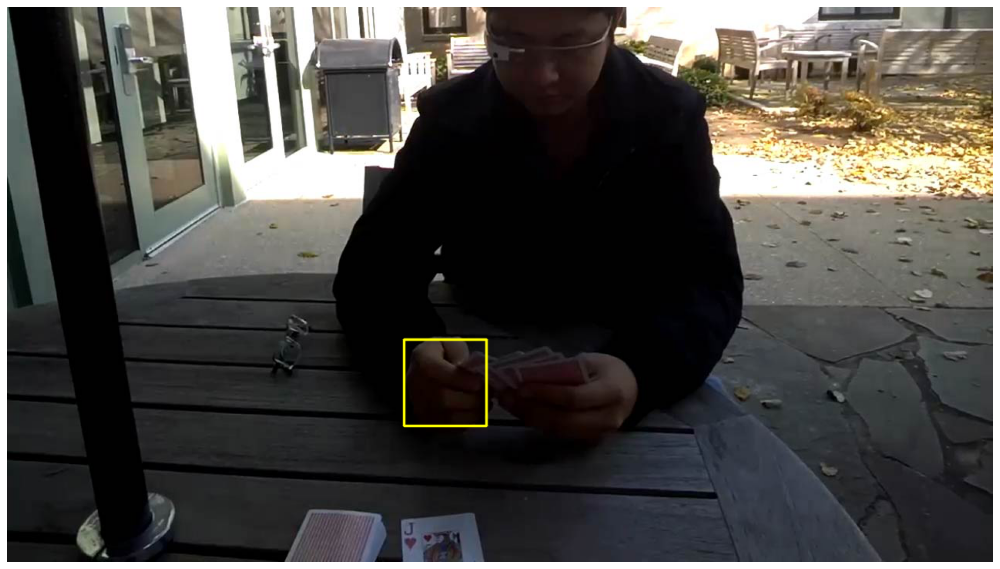

In [18]:
show_image_objects(labels_s.iloc[1]) # muestra la primera imagen anotada en este caso

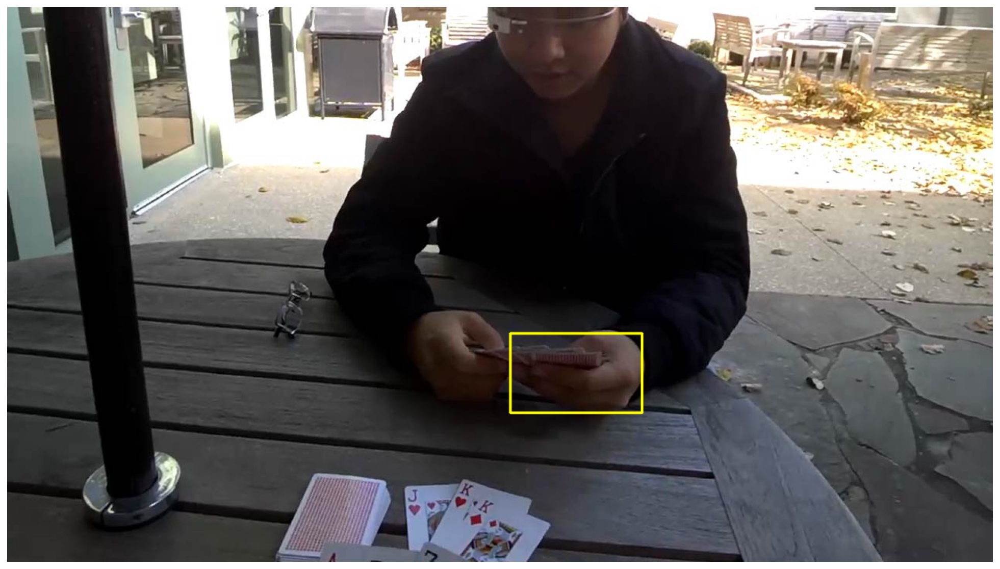

In [0]:
show_image_objects(labels_s.iloc[5]) #muestra la sexta imagen

# Preprocessing

In [0]:
#Aqui divide el dataset creado en training y test

train_df, test_df = train_test_split(
  labels_s, 
  test_size=0.2, 
  random_state=RANDOM_SEED
)

In [20]:
cd /content

/content


In [0]:
#aquí creamos los ficheros necesarios para entrenar el keras retinanet: El fichero de Annotaciones usado para el entrenamiento y el fichero que contiene las clases.
ANNOTATIONS_FILE = 'annotation.csv'
CLASSES_FILE = 'classes.csv'

In [0]:
train_df.to_csv(ANNOTATIONS_FILE, index=False, header=None) #rellenamos el fichero de anotaciones con los datos de entrenamiento

In [0]:
#Especificamos las clases que tenemos, que en este caos so0lo es una matriculas pero podrían ser mas dependiendo del caso de uso.
classes = set(['hand'])

with open(CLASSES_FILE, 'w') as f:
  for i, line in enumerate(sorted(classes)):
    f.write('{},{}\n'.format(line,i))

In [24]:
!head classes.csv #verificamos el fichero de las clases

hand,0


In [25]:
!head annotation.csv #verificamos el fichero de anotaciones con el formato apropiado aceptado por keras

CARDS_COURTYARD_H_S_frame_0060.jpg,529,277,660,374,hand
JENGA_LIVINGROOM_S_T_frame_0685.jpg,5,290,446,644,hand
CHESS_LIVINGROOM_T_H_frame_0023.jpg,5,98,145,256,hand
CHESS_COURTYARD_T_B_frame_2294.jpg,592,264,707,367,hand
CARDS_COURTYARD_H_S_frame_1680.jpg,422,314,554,417,hand
PUZZLE_COURTYARD_T_H_frame_0761.jpg,666,85,847,322,hand
PUZZLE_LIVINGROOM_B_T_frame_2515.jpg,2,614,439,718,hand
CHESS_COURTYARD_S_H_frame_0591.jpg,686,424,1149,718,hand
JENGA_OFFICE_B_S_frame_1554.jpg,635,462,775,625,hand
PUZZLE_OFFICE_S_T_frame_2000.jpg,195,555,496,716,hand


In [0]:
!cp *.csv train #No olvides ejecutar esto


# Training

In [28]:
#comenzamos con el entrenamiento y utilizaremos un modelo pre-entrenado para entrenarlo con otro dataset el de COCOS (https://github.com/fizyr/keras-retinanet/releases) y lo entrenaremos con nuestro dataset (transfer learning)
PRETRAINED_MODEL = './snapshots/_pretrained_model.h5'

URL_MODEL = 'https://github.com/fizyr/keras-retinanet/releases/download/0.5.1/resnet50_coco_best_v2.1.0.h5'
urllib.request.urlretrieve(URL_MODEL, PRETRAINED_MODEL)

print('Downloaded pretrained model to ' + PRETRAINED_MODEL)

Downloaded pretrained model to ./snapshots/_pretrained_model.h5


In [0]:
#definimos las caracteristicas del entrenamiento0
!/content/keras-retinanet/keras_retinanet/bin/train.py  --freeze-backbone  --random-transform --weights {PRETRAINED_MODEL}  --batch-size 8 --steps 500 --epochs 20 csv train/annotation.csv train/classes.csv #le indicamos el path a los ficheros de anotacion y clases utilizadas

  1/500 [..............................] - ETA: 15:25:42 - loss: 3.0652 - regression_loss: 2.0899 - classification_loss: 0.9753

# Loading the trained model

In [0]:
!ls snapshots #aqui le echamos un vistazo a la carpeta creada de snapshots --> Contiene el modelo pre-entrenado y el nuestro con 10 epochs

_pretrained_model.h5  resnet50_csv_10.h5


In [0]:
#Aqui cargamos el modelo y le especificamos la red neuronal que hemos utilizado para nuestro entrenamiento (resnet50)--> se podría modificar por otra arquitectura
model_path = os.path.join('snapshots', sorted(os.listdir('snapshots'), reverse=True)[0])
print(model_path)

model = models.load_model(model_path, backbone_name='resnet50')
model = models.convert_model(model)

labels_to_names = pd.read_csv(CLASSES_FILE, header=None).T.loc[0].to_dict() 

snapshots/resnet50_csv_10.h5


Using TensorFlow backend.


tracking <tf.Variable 'Variable:0' shape=(9, 4) dtype=float32, numpy=
array([[-22.627417, -11.313708,  22.627417,  11.313708],
       [-28.50876 , -14.25438 ,  28.50876 ,  14.25438 ],
       [-35.918785, -17.959393,  35.918785,  17.959393],
       [-16.      , -16.      ,  16.      ,  16.      ],
       [-20.158737, -20.158737,  20.158737,  20.158737],
       [-25.398417, -25.398417,  25.398417,  25.398417],
       [-11.313708, -22.627417,  11.313708,  22.627417],
       [-14.25438 , -28.50876 ,  14.25438 ,  28.50876 ],
       [-17.959393, -35.918785,  17.959393,  35.918785]], dtype=float32)> anchors
tracking <tf.Variable 'Variable:0' shape=(9, 4) dtype=float32, numpy=
array([[-45.254833, -22.627417,  45.254833,  22.627417],
       [-57.01752 , -28.50876 ,  57.01752 ,  28.50876 ],
       [-71.83757 , -35.918785,  71.83757 ,  35.918785],
       [-32.      , -32.      ,  32.      ,  32.      ],
       [-40.317474, -40.317474,  40.317474,  40.317474],
       [-50.796833, -50.796833,  50.7

# Predictions

In [0]:
#las siguientes tres funciones son las encargadas de detectar el objeto (en este caso una matricula en las imagenes de nuestro dataset) y dibujar un bounding box alrededor
def predict(image):
  image = preprocess_image(image.copy())
  image, scale = resize_image(image)

  boxes, scores, labels = model.predict_on_batch(
    np.expand_dims(image, axis=0)
  )

  boxes /= scale

  return boxes, scores, labels

In [0]:
THRES_SCORE = 0.6

def draw_detections(image, boxes, scores, labels):
  for box, score, label in zip(boxes[0], scores[0], labels[0]):
    if score < THRES_SCORE:
        break

    color = label_color(label)

    b = box.astype(int)
    draw_box(image, b, color=color)

    caption = "{} {:.3f}".format(labels_to_names[label], score)
    draw_caption(image, b, caption)


In [0]:
def show_detected_objects(image_row):
  img_path = image_row.image_name
  
  image = read_image_bgr(img_path)

  boxes, scores, labels = predict(image)

  draw = image.copy()
  draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

  true_box = [
    image_row.x_min, image_row.y_min, image_row.x_max, image_row.y_max
  ]
  draw_box(draw, true_box, color=(255, 255, 0))

  draw_detections(draw, boxes, scores, labels)

  plt.axis('off')
  plt.imshow(draw)
  plt.show()

In [0]:
test_df.head(n=10)

,image_name,x_min,y_min,x_max,y_max,class_name
13603,PUZZLE_OFFICE_T_S_frame_2042.jpg,31,422,382,705,hand
1602,CARDS_LIVINGROOM_B_T_frame_2199.jpg,232,699,283,718,hand
4965,CHESS_LIVINGROOM_H_T_frame_1905.jpg,855,315,1052,523,hand
10978,PUZZLE_COURTYARD_T_H_frame_1153.jpg,118,667,383,718,hand
2470,CARDS_LIVINGROOM_T_B_frame_1491.jpg,359,271,574,424,hand
2753,CARDS_OFFICE_B_S_frame_1677.jpg,819,535,1015,717,hand
7664,JENGA_COURTYARD_T_S_frame_1284.jpg,292,572,345,716,hand
12148,PUZZLE_LIVINGROOM_T_B_frame_0917.jpg,2,556,93,640,hand
9868,JENGA_OFFICE_T_H_frame_2530.jpg,300,143,427,272,hand
8531,JENGA_LIVINGROOM_T_S_frame_0094.jpg,521,276,869,587,hand


In [0]:
cd train

/content/train


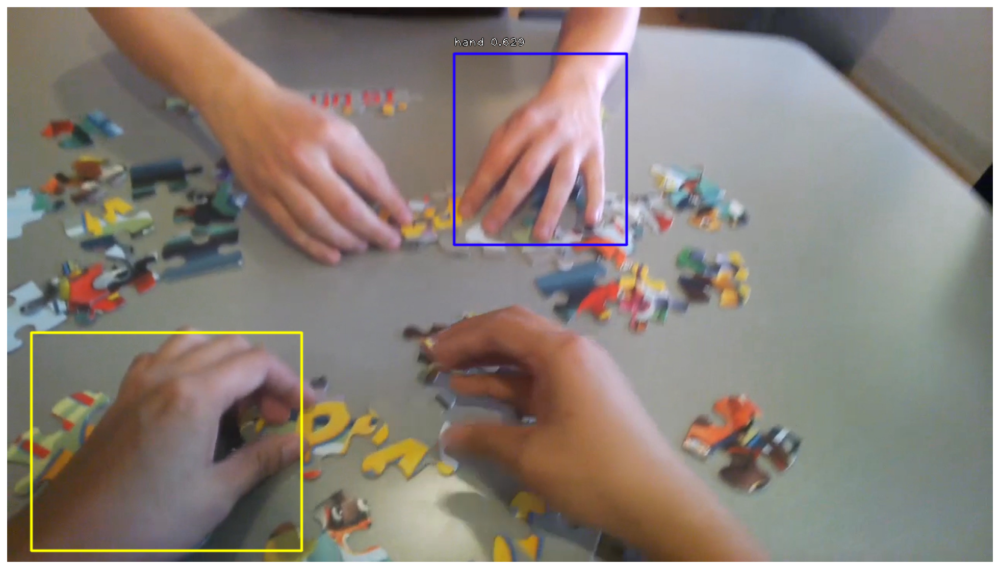

In [0]:
show_detected_objects(test_df.iloc[0])

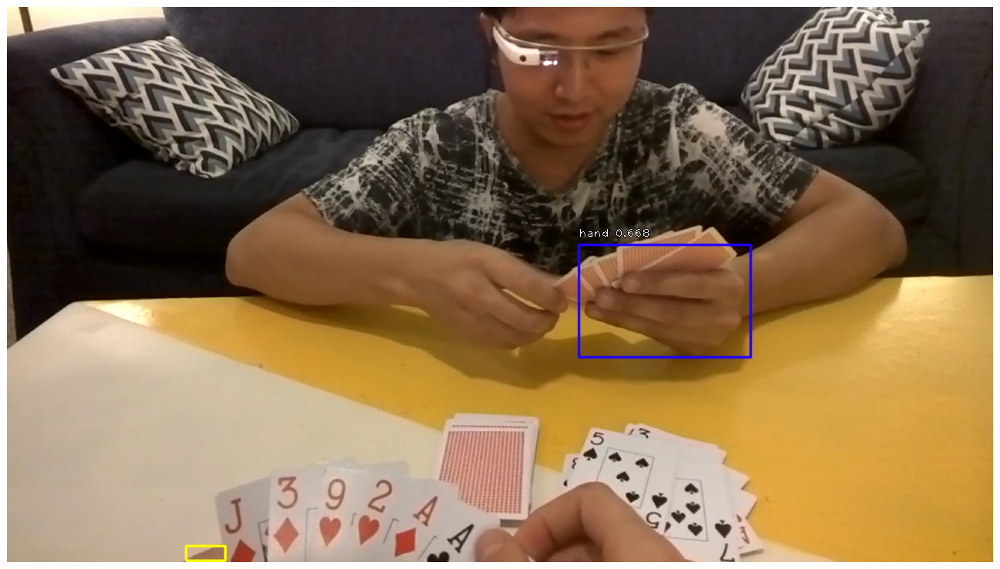

In [0]:
show_detected_objects(test_df.iloc[1])

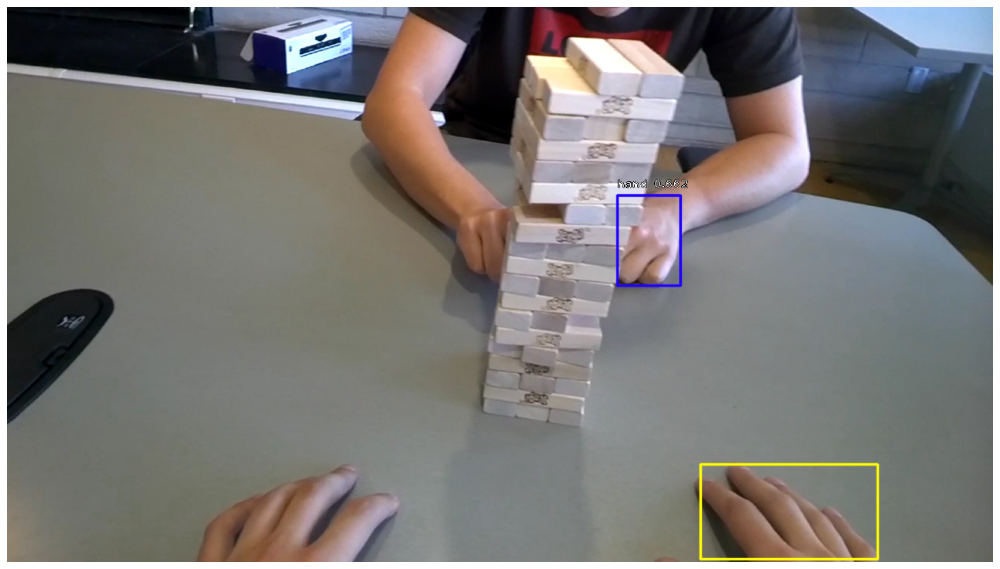

In [0]:
show_detected_objects(test_df.iloc[2730])

In [0]:
#Aqui podemos comprobar que entrenando con RetinaNet basandonos en un modelo pre-entrenado (aplicando transfer learning) con un dataset de solo 239 imagenes podemos conseguir muy buenos resultados, ya que detecta las matriculas con gran precisión.
test_df.shape

(2736, 6)